In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import scvi
import seaborn as sns
import scipy.stats

In [2]:
def subsample(adata, select, key):
    #select is the column in adata.obs that we will subsample by
    #key is the entries in obs that we will select
    index=[]
    for i in range(len(adata.obs[select])):
        if adata.obs[select][i] in key:
            index.append(i)
    return adata[index,:]

In [23]:
sigs = pd.read_csv("compiled_t_cell_sigs.csv",index_col=0)

In [4]:
#load data
um = sc.read_h5ad("um_tcells.h5ad")
um.X = um.layers["counts"]
bi005 = sc.read_h5ad("bi005_mel_tcells.h5ad")
r310 = sc.read_h5ad("r310_all_cells_annotated.h5")
r310_pre = subsample(r310, "orig.ident",["ribas_310_pre_GEX_5pv2_S26_L004"])
r310_pre_T = subsample(r310_pre, "manual_annotations",['T cells/NK cells'])
r310_pre_T.X = r310_pre_T.layers["counts"]

In [134]:
te = ['TOX', 'PDCD1', 'IL10', 'PRDM1', 'CCL3', 'HAVCR2']
pe = ['TCF7', 'SELL', 'CCR7', 'LEF1', 'IL7R', 'ID3']
de = ['HNRNPLL', 'CD28', 'CD27', 'CXCR3', 'FAS', 'ITGAL', 'IL2RB', 'CD58', 'B3GAT1']
sigs = te+pe+de+["CD4","CD8A","HNRNPLL","CD3D","CD3E"]

In [46]:
markers = [
'TOP2A',
'MKI67',
'CD4',
#'CD8',
'CXCL13',
'FOXP3',
'CD8A',
'CD8B',
'NCAM1',
'TRAC',
'TOX',
'TCF7',
'BATF'
]

In [99]:
T_all = um.concatenate(bi005,r310_pre_T)

In [47]:
#combine annotations
T_all.obs["manual_annotation"]=list(um.obs["manual_annotation"])+list(bi005.obs["manual_annotation"])+list(r310_pre_T.obs["manual_annotations"])

In [29]:
#filter nans
npt = np.asarray(T_all.to_df())

keep = []

for i in range(npt.shape[1]):
    nans = False
    if i%1000==0:
        print(i)
    for j in range(npt.shape[0]):
        if np.isnan(npt[j][i]):
            nans = True
            break
    if nans==False:
        keep.append(i)
        

T_all = T_all[:,keep]

In [38]:
T_all.layers["counts"] = T_all.X.copy()

In [39]:
#normalize + log transform using scanpy

#NORMALIZATION AND LOG TRANSFORM
sc.pp.calculate_qc_metrics(T_all, inplace=True)

# UPDATE OBS WITH USE

# store the current 'total_counts' under original_total_counts, which will not automatically be updated
# by scanpy in subsequent filtering steps
T_all.obs['original_total_counts'] = T_all.obs['total_counts']

# log10 original library size
T_all.obs['log10_original_total_counts'] = np.log10(T_all.obs['original_total_counts'])

# Normalize by median library size
med = np.median(T_all.obs['original_total_counts'])
sc.pp.normalize_per_cell(T_all, counts_per_cell_after = med)

#log transform + 1 and updates adata.X
sc.pp.log1p(T_all)

In [40]:
sc.pp.neighbors(T_all)
sc.tl.umap(T_all)

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [42]:
T_all.obs.columns

Index(['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'patient',
       'ScrubDoublet', 'ScrubDoublet_score', 'RNA_snn_res.0.8',
       'seurat_clusters', 'celltype_bped_main',
       ...
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'original_total_counts',
       'log10_original_total_counts', 'n_counts', 'manual_annotations'],
      dtype='object', length=250)

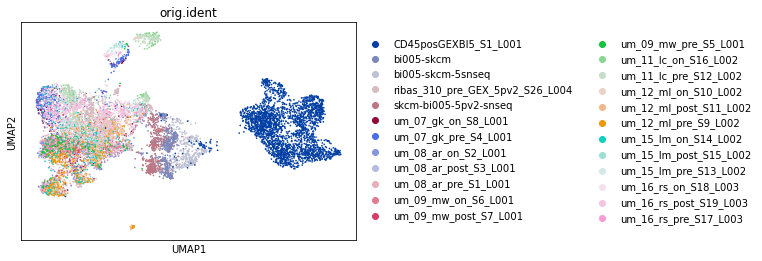

In [44]:
sc.pl.umap(T_all,color=["orig.ident"])

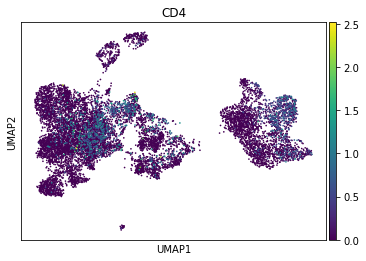

In [49]:
sc.pl.umap(T_all,color=["CD4"])

In [9]:
#make nice labels for plotting

site = []
for i in T_all.obs["orig.ident"]:
    if "um" in i:
        site.append("uveal")
    elif "ribas" in i:
        site.append("ribas_pre")
    else:
        site.append("mel")

T_all.obs["site"] = site

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'site' as categorical


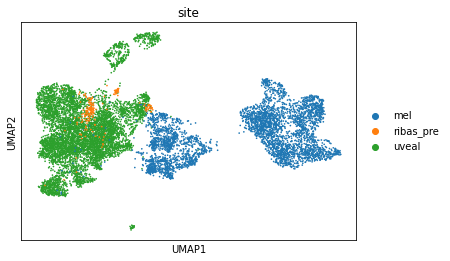

In [52]:
sc.pl.umap(T_all,color=["site"])

## Batch Correction

In [59]:
#prepare standard scVI batch correction

scvi.data.setup_anndata(T_all, layer="counts", batch_key="orig.ident")

INFO     Using batches from adata.obs["orig.ident"]                                          
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 10867 cells, 18797 vars, 24       
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


In [60]:
vae = scvi.model.SCVI(T_all, n_layers=2, n_latent=30)
vae.train()

INFO     Training for 400 epochs                                                             
INFO     KL warmup for 400 epochs                                                            
Training...: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [3:06:55<00:00, 28.04s/it]
INFO     Training time:  11215 s. / 400 epochs                                               


In [61]:
T_all.obsm["X_scVI"] = vae.get_latent_representation()

In [62]:
#save results
vae.save("T_all_scvi_model.weights")

In [124]:
sc.pp.neighbors(T_all, use_rep="X_scVI")
sc.tl.umap(T_all)

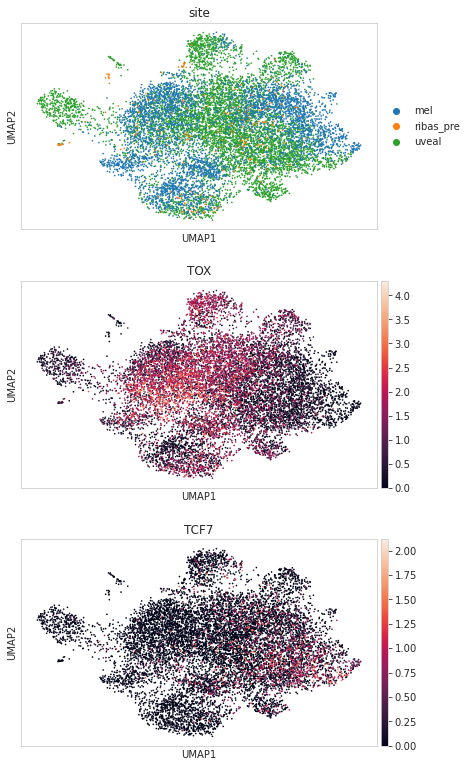

In [130]:
sc.pl.umap(T_all, color=["site","TOX","TCF7"],ncols=1)

In [63]:
#with reconstructed gene space for UMAP (averaged across all batch transforms)
batch_norm=[]
for i in np.unique(T_all.obs["orig.ident"]):
    print(i)
    batch_norm.append(vae.get_normalized_expression(transform_batch=i))

CD45posGEXBI5_S1_L001
bi005-skcm
bi005-skcm-5snseq
ribas_310_pre_GEX_5pv2_S26_L004
skcm-bi005-5pv2-snseq
um_07_gk_on_S8_L001
um_07_gk_pre_S4_L001
um_08_ar_on_S2_L001
um_08_ar_post_S3_L001
um_08_ar_pre_S1_L001
um_09_mw_on_S6_L001
um_09_mw_post_S7_L001
um_09_mw_pre_S5_L001
um_11_lc_on_S16_L002
um_11_lc_pre_S12_L002
um_12_ml_on_S10_L002
um_12_ml_post_S11_L002
um_12_ml_pre_S9_L002
um_15_lm_on_S14_L002
um_15_lm_post_S15_L002
um_15_lm_pre_S13_L002
um_16_rs_on_S18_L003
um_16_rs_post_S19_L003
um_16_rs_pre_S17_L003


In [64]:
T_all.layers["scvi_normalized"]=np.mean(np.asarray(batch_norm),axis=0)

In [4]:
#make new anndata using scVI reconstructed data
normed=sc.AnnData(T_all.layers["scvi_normalized"])

normed.obs["sample"]=list(T_all.obs["orig.ident"])
normed.obs["celltype"]=list(T_all.obs["manual_annotation"])

sc.pp.neighbors(normed)

sc.tl.umap(normed)

In [3]:
pmap2=[ "#010067","#9E008E","#00FF00","#FFE502","#005F39","#FF937E",
          "#A42400","#001544","#91D0CB","#620E00","#0000FF","#007DB5","#6A826C","#00AE7E","#C28C9F",
          "#BE9970","#008F9C","#5FAD4E","#FF0000","#FF00F6","#FF029D","#683D3B","#FF74A3","#968AE8","#98FF52",
          "#A75740","#01FFFE","#FFEEE8","#FE8900","#BDC6FF","#01D0FF","#BB8800","#7544B1","#A5FFD2","#FFA6FE",
          "#774D00","#7A4782","#263400","#004754","#43002C","#B500FF","#FFB167","#FFDB66","#90FB92","#7E2DD2",
          "#BDD393","#E56FFE","#DEFF74","#00FF78","#009BFF","#006401","#0076FF","#85A900","#00B917","#788231",
          "#00FFC6","#FF6E41","#E85EBE","000000"]

# Sequentially annotate cell clusters

### Granular annotation round 1

In [3]:
markers = [
'TOP2A',
'MKI67',
'CD4',
#'CD8',
#'CXCL13',
'FOXP3',
#'CD8A',
'CD8B',
'NCAM1',
'TRAC',
'TOX',
'TCF7',
'BATF'
]

In [7]:
#define clusters
sc.pp.pca(normed, n_comps= 100)
communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(normed.obsm['X_pca']), k = 200)

Finding 200 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 12.435185432434082 seconds
Jaccard graph constructed in 14.026553630828857 seconds
Wrote graph to binary file in 7.902403116226196 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.705292
After 2 runs, maximum modularity is Q = 0.707081
After 21 runs, maximum modularity is Q = 0.708787
Louvain completed 41 runs in 35.929126262664795 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 73.96196746826172 seconds


In [8]:
normed.obs['PhenoGraph_clusters'] = pd.Categorical(communities)
normed.uns['PhenoGraph_Q'] = Q

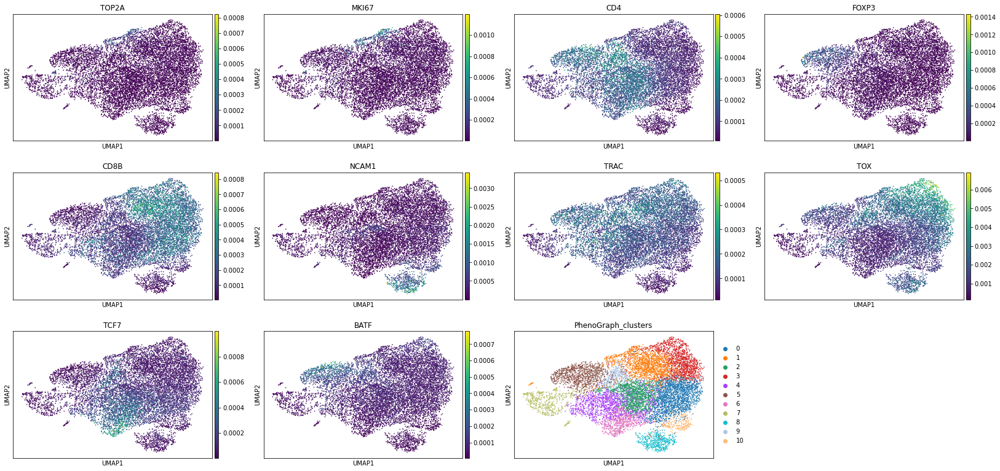

In [17]:
sc.pl.umap(normed, color=markers+["PhenoGraph_clusters"])

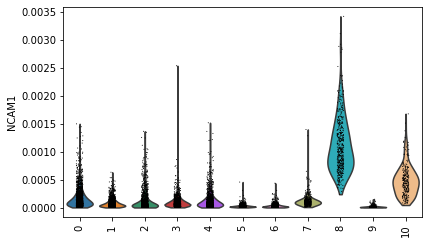

In [34]:
sc.pl.violin(normed, keys='NCAM1', groupby='PhenoGraph_clusters', rotation=90)

In [47]:
#get DEGs
sc.tl.rank_genes_groups(normed, 'PhenoGraph_clusters', method='t-test', key_added = "t-test")

ttest=pd.DataFrame()
for i in np.unique(normed.obs["PhenoGraph_clusters"]):
    genelist=[]
    counts=0
    ttest_ii=sc.get.rank_genes_groups_df(normed,key='t-test',group=str(i)).sort_values(["logfoldchanges"],ascending=False)
    ttest_ii.to_csv("Tcell_analysis_Cluster "+str(i)+"DEGs_with_LFC.csv")

In [19]:
#export DEGs for analysis
ttest.to_csv("T_cell_analysis_ttest_DEGS.csv",index_label=0,index=False)

In [228]:
#label with annotations (these blocks are run in backwards order after all the rounds of annotation are done)
manual_annotations = []
for i in range(len(normed.obs_names)):
    if normed.obs["PhenoGraph_clusters"][i]==5:
        manual_annotations.append("Tregs")
    elif normed.obs["PhenoGraph_clusters"][i]==7:
        manual_annotations.append("Melanoma")
    elif normed.obs["PhenoGraph_clusters"][i]==8:
        manual_annotations.append("NK")
    else:
        manual_annotations.append("Null")

In [229]:
manual = pd.DataFrame(index=normed.obs_names, data=manual_annotations)

In [22]:
normed.obs['PhenoGraph_clusters'].to_csv("T-NKs_clusters",index_label=0,index=False)
pd.DataFrame(normed.obsm['X_umap']).to_csv("T-NKs_umap",index_label=0,index=False)

In [236]:
#save
normed.write_h5ad("T-NKs_normed_with_clusters.h5ad")
normed = sc.read_h5ad("T-NKs_normed_with_clusters.h5ad")
normed.obs_names = T_all.obs_names

In [234]:
#once all manual annotations have been compiled, add to data
normed.obs["manual_annotations"] = manual[0]
norm = subsample(normed, 'manual_annotations',['CD4 T-cells','CD8 T-cells','Cycling','NK','Tregs'])
sc.pp.neighbors(norm)
sc.tl.umap(norm)

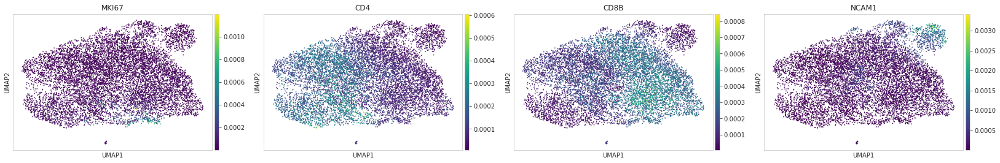

In [257]:
sc.pl.umap(norm,color=["MKI67","CD4","CD8B","NCAM1"],cmap='viridis',save='figures/annots_markers.pdf')

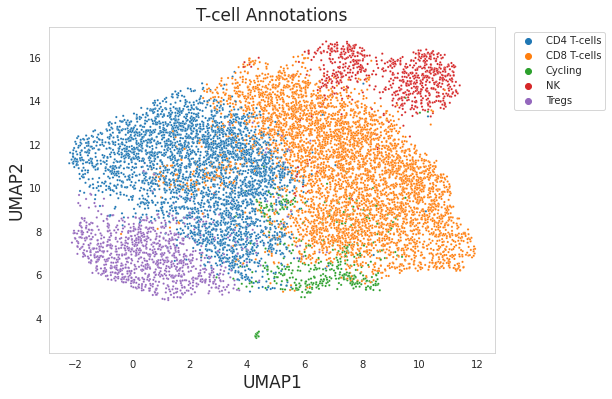

In [258]:
#visualize all annotations
randomize=np.arange(norm.shape[0])
np.random.shuffle(randomize)
fig, ax = plt.subplots(figsize=(8,6))
sns.set_style("whitegrid", {'axes.grid' : False})
scatter=sns.scatterplot(x=norm.obsm["X_umap"][:,0][randomize],y=norm.obsm["X_umap"][:,1][randomize], hue=norm.obs["manual_annotations"][randomize],s=5)
scatter.legend(bbox_to_anchor= (1.03, 1) );
scatter.set_xlabel("UMAP1", fontsize = 17)
scatter.set_ylabel("UMAP2", fontsize = 17)
scatter.set_title("T-cell Annotations", fontsize = 17)
plt.savefig("figures/tcells/annots_all.pdf",format='pdf',bbox_inches='tight')

### Granular annotation round 2

In [97]:
#downsample based on chosen clusters in round 1
filtered = subsample(normed, "PhenoGraph_clusters", [0,1,2,3,4,6,9,10])

In [99]:
#re-cluster
sc.pp.pca(filtered, n_comps= 100)

communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(filtered.obsm['X_pca']), k = 200)

Finding 200 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 8.913001775741577 seconds
Jaccard graph constructed in 11.064503908157349 seconds
Wrote graph to binary file in 5.784315347671509 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.635317
After 2 runs, maximum modularity is Q = 0.638463
After 5 runs, maximum modularity is Q = 0.640554
After 11 runs, maximum modularity is Q = 0.642081
Louvain completed 31 runs in 22.719959020614624 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 52.64644145965576 seconds


In [100]:
filtered.obs['PhenoGraph_clusters'] = pd.Categorical(communities)
filtered.uns['PhenoGraph_Q'] = Q

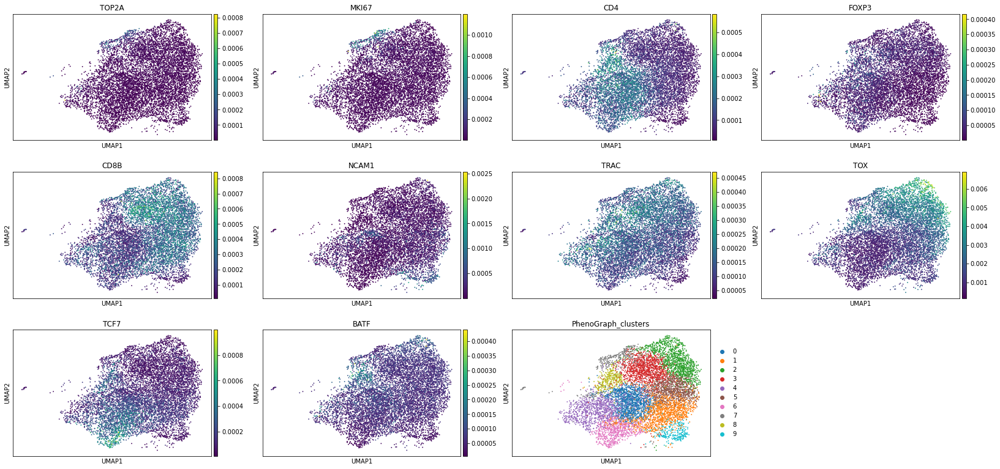

In [101]:
sc.pp.neighbors(filtered)
sc.tl.umap(filtered)
sc.pl.umap(filtered, color=markers+["PhenoGraph_clusters"])

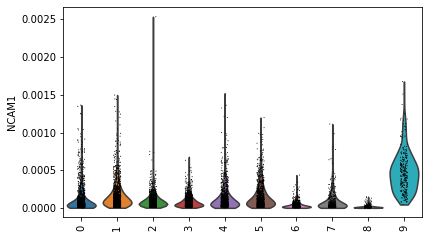

In [8]:
sc.pl.violin(filtered, keys='NCAM1', groupby='PhenoGraph_clusters', rotation=90)

In [113]:
#save
filtered.write_h5ad("T-NKs_filtered_with_clusters.h5ad")
filtered = sc.read_h5ad("T-NKs_filtered_with_clusters.h5ad")

In [231]:
#label with annotations
for i in range(len(filtered.obs_names)):
    if filtered.obs["PhenoGraph_clusters"][i]==7:
        manual.loc[filtered.obs_names[i]]="Cycling"
    elif filtered.obs["PhenoGraph_clusters"][i]==9:
        manual.loc[filtered.obs_names[i]]="NK"

In [14]:
#get DEGs
sc.tl.rank_genes_groups(filtered, 'PhenoGraph_clusters', method='t-test', key_added = "t-test")

ttest=pd.DataFrame()
for i in np.unique(filtered.obs["PhenoGraph_clusters"]):
    genelist=[]
    counts=0
    ttest_ii=sc.get.rank_genes_groups_df(filtered,key='t-test',group=str(i)).sort_values(["logfoldchanges"],ascending=False)
    ttest_ii.to_csv("Tcell_analysis_filtered1 "+str(i)+"DEGs_with_LFC.csv")

### Granular annotation round 3: CD4/CD8 subclustering

In [6]:
#downsample based on chosen clusters in round 2
filtered = subsample(filtered, "PhenoGraph_clusters", [0,4,6,8,1,2,3,5])

In [7]:
#re-cluster
sc.pp.pca(filtered, n_comps= 100)

communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(filtered.obsm['X_pca']), k = 200)

filtered.obs['PhenoGraph_clusters'] = pd.Categorical(communities)
filtered.uns['PhenoGraph_Q'] = Q

Finding 200 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 8.514364957809448 seconds
Jaccard graph constructed in 10.091607809066772 seconds
Wrote graph to binary file in 5.119130849838257 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.635573
After 2 runs, maximum modularity is Q = 0.638792
After 3 runs, maximum modularity is Q = 0.641402
After 21 runs, maximum modularity is Q = 0.643338
Louvain completed 41 runs in 23.079359769821167 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 49.61378860473633 seconds


In [8]:
#filtered = sc.read_h5ad("T-CD4-CD8_filtered_with_clusters.h5ad")

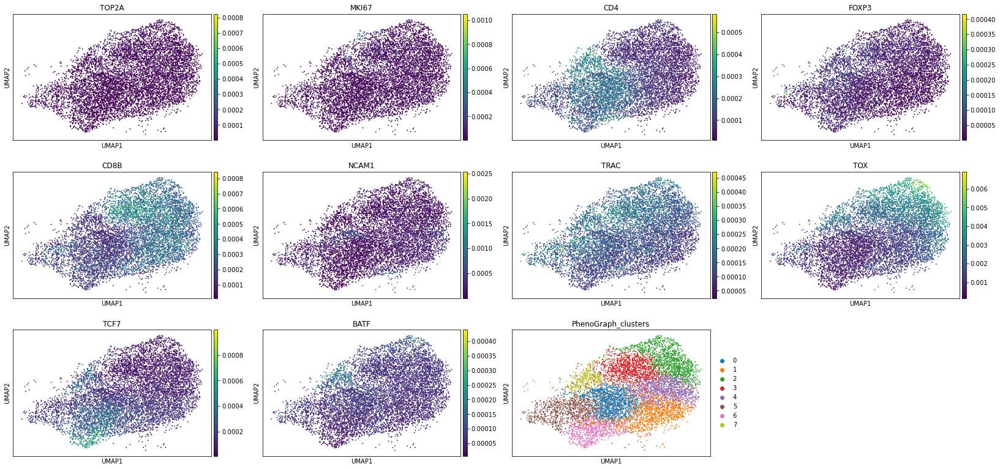

In [9]:
sc.pp.neighbors(filtered)
sc.tl.umap(filtered)
sc.pl.umap(filtered, color=markers+["PhenoGraph_clusters"])

In [9]:
#save
filtered.write_h5ad("T-CD4-CD8_filtered_with_clusters.h5ad")

In [233]:
#label with annotation
for i in range(len(filtered.obs_names)):
    if filtered.obs["PhenoGraph_clusters"][i] in [7,0,6,5]:
        manual.loc[filtered.obs_names[i]]="CD4 T-cells"
    elif filtered.obs["PhenoGraph_clusters"][i] in [1,2,3,4]:
        manual.loc[filtered.obs_names[i]]="CD8 T-cells"

In [ ]:
sc.pl.violin(filtered, keys='NCAM1', groupby='PhenoGraph_clusters', rotation=90)

In [14]:
#get DEGs
sc.tl.rank_genes_groups(filtered, 'PhenoGraph_clusters', method='t-test', key_added = "t-test")

ttest=pd.DataFrame()
for i in np.unique(filtered.obs["PhenoGraph_clusters"]):
    genelist=[]
    counts=0
    ttest_ii=sc.get.rank_genes_groups_df(filtered,key='t-test',group=str(i)).sort_values(["logfoldchanges"],ascending=False)
    ttest_ii.to_csv("Tcell_analysis_filtered2 "+str(i)+"DEGs_with_LFC.csv")

### Granular annotation round 4A: CD4s

In [10]:
#downsample based on identified CD4 clusters in round 3
cd4 = subsample(filtered, "PhenoGraph_clusters", [7,0,6,5])

In [6]:
#re-cluster
sc.pp.pca(cd4, n_comps= 200)

communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(cd4.obsm['X_pca']), k = 700)

cd4.obs['PhenoGraph_clusters'] = pd.Categorical(communities)
cd4.uns['PhenoGraph_Q'] = Q

Finding 700 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 3.7313218116760254 seconds
Jaccard graph constructed in 20.562923908233643 seconds
Wrote graph to binary file in 8.182659149169922 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.438139
After 8 runs, maximum modularity is Q = 0.442439
Louvain completed 28 runs in 11.950400114059448 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 47.61871862411499 seconds


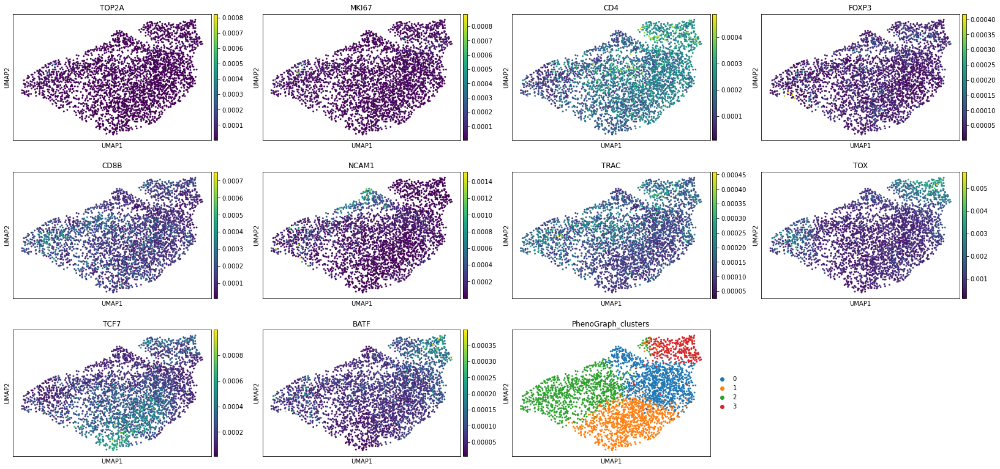

In [7]:
sc.pp.neighbors(cd4)
sc.tl.umap(cd4)
sc.pl.umap(cd4, color=markers+["PhenoGraph_clusters"])

In [8]:
#save
cd4.write_h5ad("T-cell_CD4s_clustered.h5ad")

In [4]:
#cd4 = sc.read_h5ad("T-cell_CD4s_clustered.h5ad")

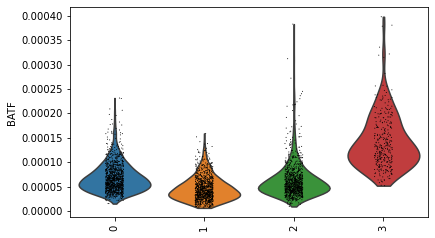

In [25]:
sc.pl.violin(cd4, keys='BATF', groupby='PhenoGraph_clusters', rotation=90)

In [24]:
#get DEGs
sc.tl.rank_genes_groups(cd4, 'PhenoGraph_clusters', method='t-test', key_added = "t-test")

ttest=pd.DataFrame()
for i in np.unique(cd4.obs["PhenoGraph_clusters"]):
    genelist=[]
    counts=0
    ttest_ii=sc.get.rank_genes_groups_df(cd4,key='t-test',group=str(i)).sort_values(["logfoldchanges"],ascending=False)
    ttest_ii.to_csv("Tcell_DEGs/Tcell_analysis_filtered_CD4 "+str(i)+"DEGs_with_LFC.csv")

### Granular annotation round 4B: CD8s

In [14]:
#downsample based on identified CD8 clusters in round 3
cd8 = subsample(filtered, "PhenoGraph_clusters", [1,2,3,4])

In [11]:
#re-cluster
sc.pp.pca(cd8, n_comps= 500)

communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(cd8.obsm['X_pca']), k = 900)

cd8.obs['PhenoGraph_clusters'] = pd.Categorical(communities)
cd8.uns['PhenoGraph_Q'] = Q

Finding 900 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 5.710158586502075 seconds
Jaccard graph constructed in 46.698341369628906 seconds
Wrote graph to binary file in 12.02919888496399 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.440584
Louvain completed 21 runs in 18.7773654460907 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 87.54702758789062 seconds


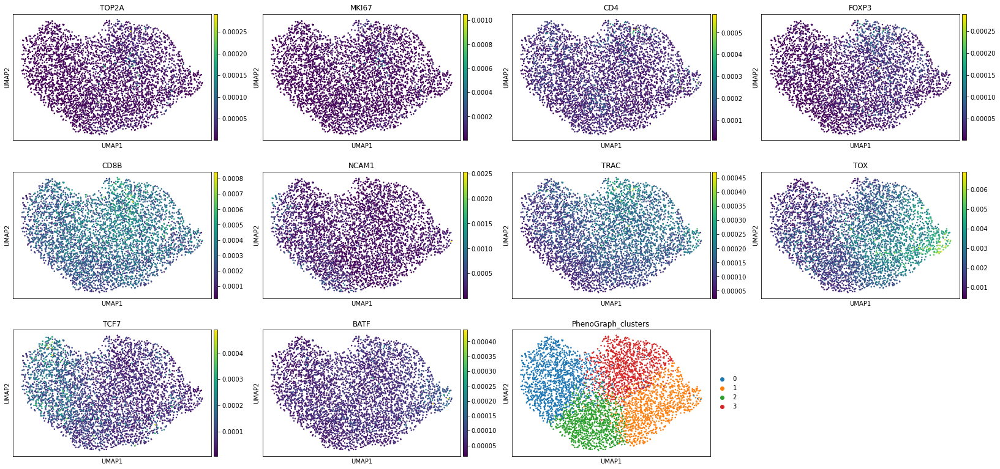

In [12]:
sc.pp.neighbors(cd8)
sc.tl.umap(cd8)
sc.pl.umap(cd8, color=markers+["PhenoGraph_clusters"])

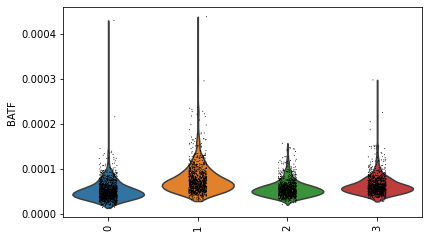

In [14]:
sc.pl.violin(cd8, keys='BATF', groupby='PhenoGraph_clusters', rotation=90)

In [88]:
#get DEGs
sc.tl.rank_genes_groups(cd8, 'PhenoGraph_clusters', method='t-test', key_added = "t-test")

ttest=pd.DataFrame()
for i in np.unique(cd8.obs["PhenoGraph_clusters"]):
    genelist=[]
    counts=0
    ttest_ii=sc.get.rank_genes_groups_df(cd8,key='t-test',group=str(i)).sort_values(["logfoldchanges"],ascending=False)
    ttest_ii.to_csv("Tcell_DEGs/Tcell_analysis_filtered_CD8 "+str(i)+"DEGs_with_LFC.csv")

In [39]:
#save
cd8.write_h5ad("T-cell_CD8s_clustered.h5ad")
#cd8 = sc.read_h5ad("T-cell_CD8s_clustered.h5ad")

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'site' as categorical


## Analysis of CD8 T-cells

In [ ]:
#run Diffusion components
sc.pp.neighbors(cd8)
sc.tl.diffmap(cd8)
for i in range(cd8.obsm["X_diffmap"].shape[1]):
    cd8.obs["Diffusion component "+str(i)]=cd8.obsm["X_diffmap"][:,i]

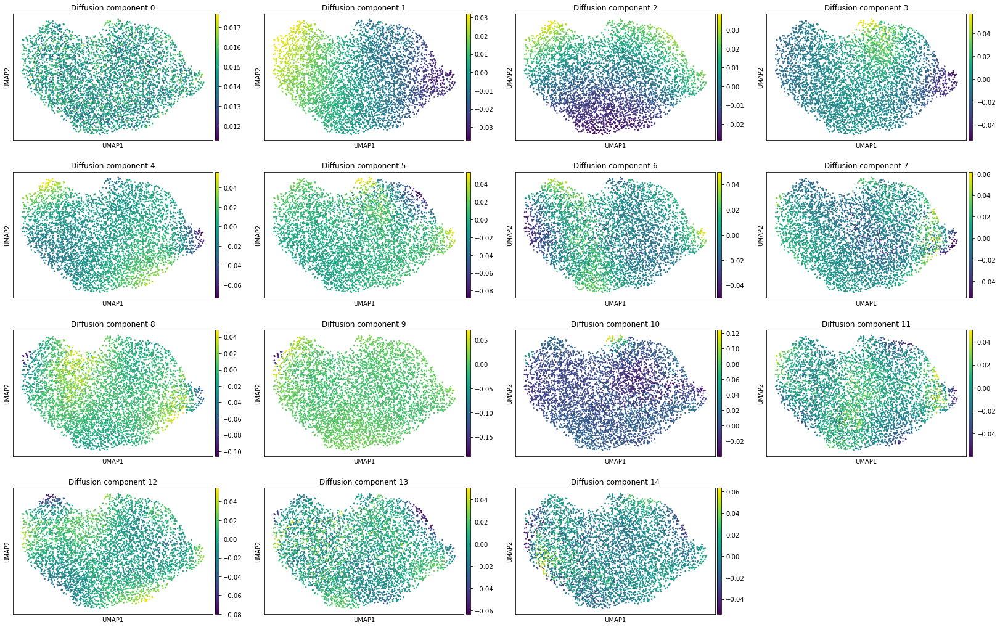

In [37]:
#visualize DCs
cd8.obs["Diffusion component 3"]=-1*cd8.obs["Diffusion component 3"]
cd8.obs["Diffusion component 2"]=-1*cd8.obs["Diffusion component 2"]
cd8.obs["Diffusion component 1"]=-1*cd8.obs["Diffusion component 1"]
sc.pl.umap(cd8, color=["Diffusion component "+str(i) for i in range(cd8.obsm["X_diffmap"].shape[1])])

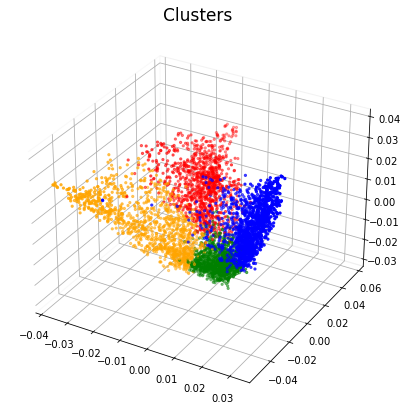

In [52]:
#plot CD8 clusters in 3D DC space (with randomization)
site_colors = {0:"blue",1:"orange",2:"green",3:"red"}

        
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')
randomize=np.arange(cd8.shape[0])
np.random.shuffle(randomize)

ax.scatter(cd8.obs["Diffusion component 1"][randomize],
           cd8.obs["Diffusion component 3"][randomize],
           cd8.obs["Diffusion component 2"][randomize], 
           c=pd.Series(cd8.obs["PhenoGraph_clusters"]).map(site_colors)[randomize],s=5)
plt.title("Clusters",fontsize=17)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
plt.savefig("figures/tcells/clusters.pdf",format='pdf',bbox_inches='tight')

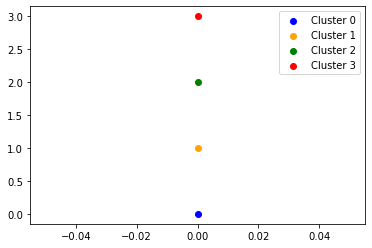

In [54]:
#generate legend for above plot
plt.scatter([0],[0],label='Cluster 0',c='blue')
plt.scatter([0],[1],label='Cluster 1',c='orange')
plt.scatter([0],[2],label='Cluster 2',c='green')
plt.scatter([0],[3],label='Cluster 3',c='red')
plt.legend()
plt.savefig("figures/tcells/clusters_legend.pdf",format='pdf',bbox_inches='tight')

In [32]:
#get library size
cd8_libsize = list(tmp.obs.loc[cd8.obs_names]["library_size"])

Text(0.5, 0.92, 'CD8 T-cells library size')

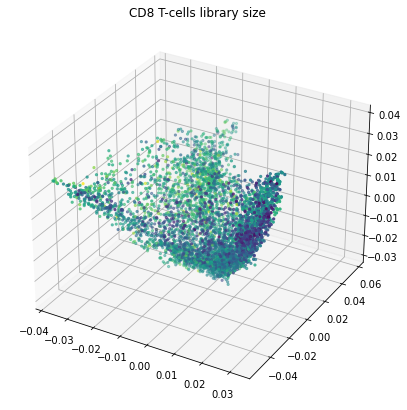

In [40]:
#plot library size
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')

ax.scatter(cd8.obs["Diffusion component 1"],cd8.obs["Diffusion component 3"],cd8.obs["Diffusion component 2"], c=np.log(cd8_libsize),s=5)
plt.title("CD8 T-cells library size")

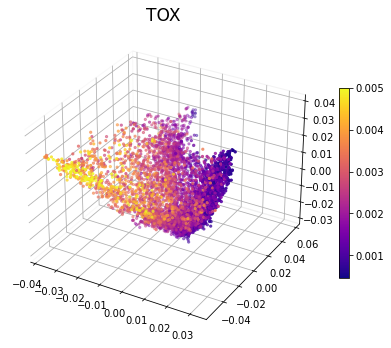

In [62]:
#plot TOX expression in DC space
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')

p=ax.scatter(cd8.obs["Diffusion component 1"],cd8.obs["Diffusion component 3"],cd8.obs["Diffusion component 2"], c=cd8.to_df()["TOX"],s=5,vmax=.005,cmap='plasma')
plt.title("TOX",fontsize=17)
fig.colorbar(p,shrink=.5)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
plt.savefig("figures/tcells/tox.pdf",format='pdf',bbox_inches='tight')

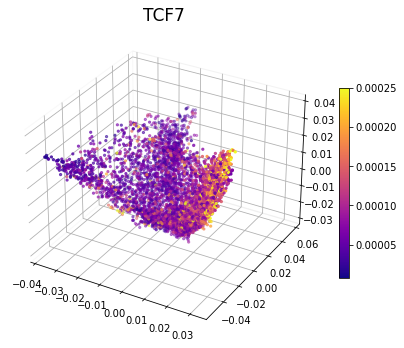

In [64]:
#plot TCF7 in DC space
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')

p=ax.scatter(cd8.obs["Diffusion component 1"],cd8.obs["Diffusion component 3"],cd8.obs["Diffusion component 2"], c=cd8.to_df()["TCF7"],s=5,vmax=.00025,cmap='plasma')
plt.title("TCF7",fontsize=17)
fig.colorbar(p,shrink=.5)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
plt.savefig("figures/tcells/tcf.pdf",format='pdf',bbox_inches='tight')

In [69]:
#add patient of origin to obs
patient_id = [patients[i] for i in cd8.obs["sample"]]
cd8.obs["patient"] = patient_id

No handles with labels found to put in legend.


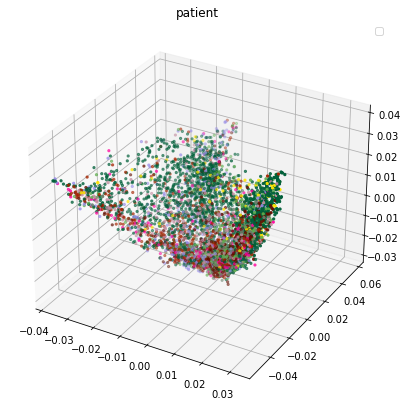

In [70]:
#plot patient origin in DC space
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')
randomize=np.arange(cd8.shape[0])
np.random.shuffle(randomize)

ax.scatter(cd8.obs["Diffusion component 1"][randomize],
           cd8.obs["Diffusion component 3"][randomize],
           cd8.obs["Diffusion component 2"][randomize], 
           c=pd.Series(cd8.obs["patient"]).map(color)[randomize],s=5)
plt.title("patient")
ax.legend()

In [65]:
#add site of origin to obs
site_colors = {'uveal':'teal', 'ribas_pre':'orange', 'mel':'magenta'}
site = []
for i in cd8.obs["patient"]:
    if "Um" in i:
        site.append("uveal")
    elif "Ribas" in i:
        site.append("ribas_pre")
    else:
        site.append("mel")
cd8.obs["site"] = site 

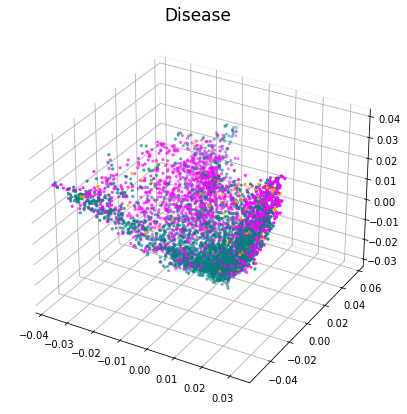

In [66]:
#plot site of origin in DC space      
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')
randomize=np.arange(cd8.shape[0])
np.random.shuffle(randomize)

ax.scatter(cd8.obs["Diffusion component 1"][randomize],
           cd8.obs["Diffusion component 3"][randomize],
           cd8.obs["Diffusion component 2"][randomize], 
           c=pd.Series(site).map(site_colors)[randomize],s=5)
plt.title("Disease",fontsize=17)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
plt.savefig("figures/tcells/disease.pdf",format='pdf',bbox_inches='tight')

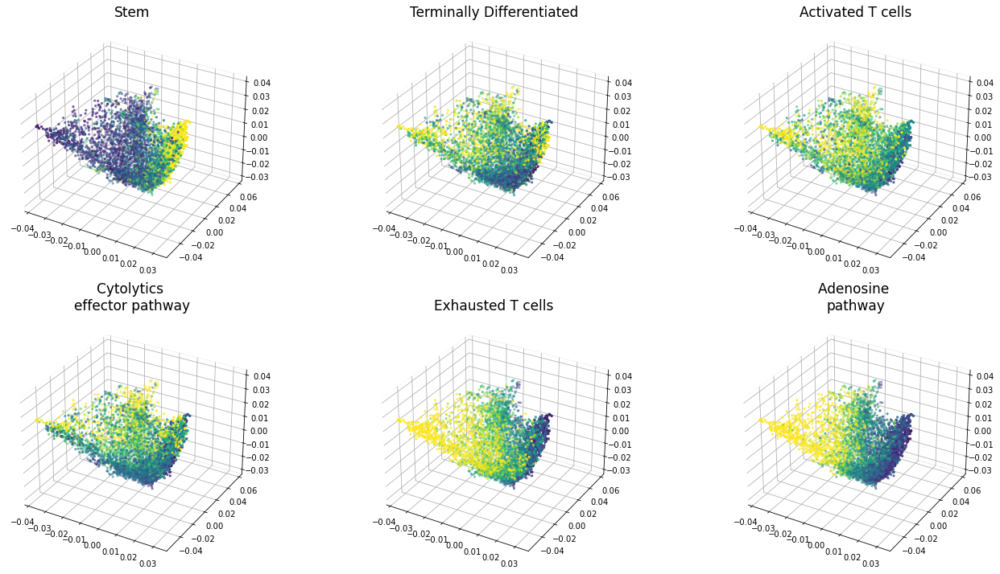

In [139]:
#plot signatures in DC space
sig_names = ['Stem',"Terminally Differentiated","Activated T cells", 'Cytolytics \neffector pathway', 'Exhausted T cells', 'Adenosine \npathway']

fig, ax = plt.subplots(2,3,figsize=(20,10),subplot_kw=dict(projection='3d'))
for i in range(6):
    diffusion_plot(sig_names[i],ax[i//3][i%3],cd8.to_df(),cd8)
plt.tight_layout()
plt.savefig("figures/tcells/signatures.pdf",format='pdf',bbox_inches='tight')

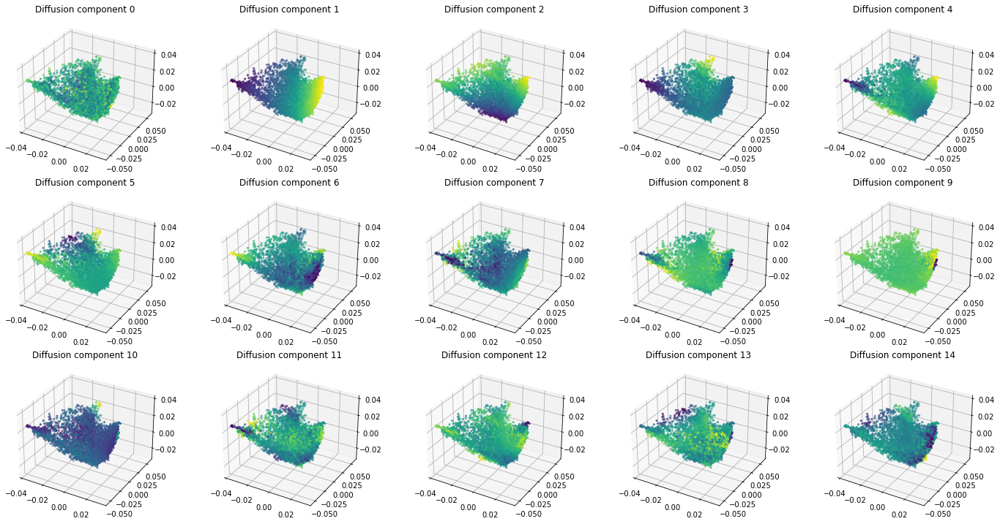

In [77]:
#for visualizing DCs in space of chosen DCs
fig, ax = plt.subplots(3, 5,figsize=(20,10),subplot_kw=dict(projection='3d'))
for i in range(15):
    color_DCs("Diffusion component "+str(i),ax[i//5][i%5],cd8.to_df(),cd8)
plt.tight_layout()

In [113]:
#subsampling for some sites of interest
mel = subsample(cd8, "site", ["mel"])
not3p = [i for i in np.unique(cd8.obs["sample"]) if i!='bi005-skcm']
not3p = subsample(cd8, 'sample', not3p)
not3p = [i for i in np.unique(cd8.obs["sample"]) if i!='bi005-skcm']

In [69]:
def partition(adata, data, key):
    #function that is useful for making violin plots
    slices = []
    for i in np.unique(adata.obs[key]):
        one_slice = []
        for j in range(adata.shape[0]):
            if adata.obs[key][j]==i:
                one_slice.append(data[j])
        slices.append(one_slice) #normalize 
        #print(max(one_slice))
    return slices

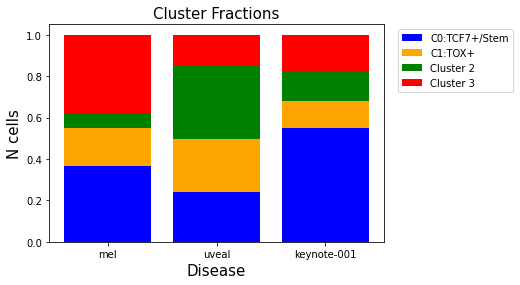

<Figure size 432x288 with 0 Axes>

In [86]:
#plot cluster fractions
#subsample by cluster
c0 = subsample(not3p, "site",["mel"])
c1 = subsample(not3p, "site",["uveal"])
c2 = subsample(not3p, "site",["ribas_pre"])

#get counts of site per cluster
x = ['mel', 'uveal', 'keynote-001']
c0 = np.unique(c0.obs["PhenoGraph_clusters"],return_counts=True)[1]
c1 = np.unique(c1.obs["PhenoGraph_clusters"],return_counts=True)[1]
c2 = np.unique(c2.obs["PhenoGraph_clusters"],return_counts=True)[1]

#compute fractions
c0 = c0/sum(c0)
c1 = c1/sum(c1)
c2 = c2/sum(c2)

y1 = [c0[0],c1[0],c2[0]]
y2 = [c0[1],c1[1],c2[1]]
y3 = [c0[2],c1[2],c2[2]]
y4 = [c0[3],c1[3],c2[3]]

# plot bars in stacked manner
plt.bar(x, y1, color='blue')
plt.bar(x, y2, bottom=y1, color='orange')
plt.bar(x, y3, bottom=np.asarray(y1)+np.asarray(y2), color='green')
plt.bar(x, y4, bottom=np.asarray(y1)+np.asarray(y2)+np.asarray(y3), color='red')
plt.xlabel("Disease",fontsize=15)
plt.ylabel("N cells",fontsize=15)
plt.legend(["C0:TCF7+/Stem","C1:TOX+","Cluster 2", "Cluster 3"], loc='upper right',bbox_to_anchor=(1.4, 1))

plt.title("Cluster Fractions",fontsize=15)
plt.show()
plt.savefig("figures/tcells/fractions.pdf",format='pdf',bbox_inches='tight')

In [20]:
def get_sig(normed,key):
    #get mean of signatures across all constituent genes
    tmp = []
    normed_df = normed.to_df()
    for i in sigs.loc[key]:
        if not pd.isnull(i):
            if "+" in i:
                gene = i.split("+")[0].strip()
                if gene in normed_df.columns:
                    #print(i)
                    tmp.append(normed_df[gene])
            elif "-" in i:
                gene = i.split("-")[0].strip()
                if gene in normed_df.columns:
                    #print(i)
                    tmp.append(normed_df[gene]*-1)
            else:
                if i in normed_df.columns:
                    #print(i)
                    tmp.append(normed_df[i])
    return np.mean(tmp,axis=0)

In [26]:
#look at distribution of Stem expression to determine a cutoff
stem = get_sig(cd8, 'Stem')

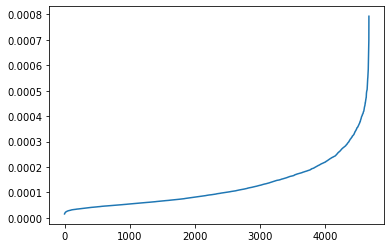

In [141]:
plt.plot(np.sort(stem))

In [27]:
#identify some cells that are stem-like
remove = []
for i in range(len(stem)):
    if stem[i] > .0007:
        remove.append(True)
    else:
        remove.append(False)

cd8.obs["is_stem"] = remove

Text(0.5, 0.92, 'stem')

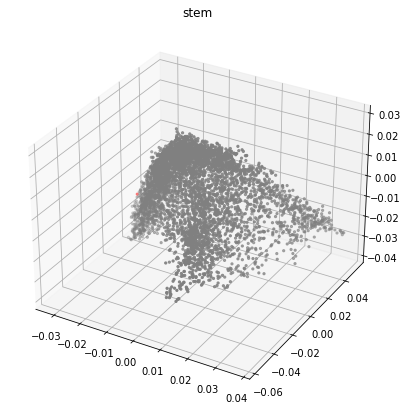

In [28]:
#visualize where stem-like cell(s) are
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')

bin_colors = {True: "red", False: "grey"}
ax.scatter(cd8.obs["Diffusion component 1"],cd8.obs["Diffusion component 3"],cd8.obs["Diffusion component 2"], c=pd.Series(remove).map(bin_colors),s=5)
plt.title("stem")

In [29]:
#set root to one of the stemlike cells
cd8.uns['iroot'] = np.flatnonzero(cd8.obs['is_stem'] == 1)[0]

In [30]:
#run diffusion pseudotime analysis
sc.tl.dpt(cd8)

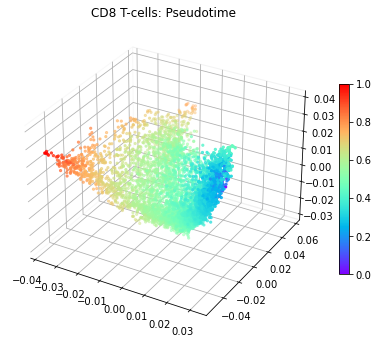

In [34]:
#plot pseudotime in DC space
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')

p=ax.scatter(-1*cd8.obs["Diffusion component 1"],-1*cd8.obs["Diffusion component 3"],-1*cd8.obs["Diffusion component 2"], c=cd8.obs["dpt_pseudotime"],s=5, cmap='rainbow')
plt.title("CD8 T-cells: Pseudotime")
fig.colorbar(p,shrink=.5)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

plt.savefig("figures/tcells/pseudotime.pdf",format='pdf',bbox_inches='tight')

## TCR occurences + mait/inkt analysis

In [77]:
#load all of the TCR data
tcr_dict = {
    'CD45posGEXBI5_S1_L001':pd.read_csv("TCR_NEW/TCRBI5_S1_L001_TR_frequency.csv"), 
    #'bi005-skcm', 
    'bi005-skcm-5snseq':pd.read_csv("TCR_NEW/bi005-skcm-5snseq-TCR_TR_frequency.csv"),
    'ribas_310_pre_GEX_5pv2_S26_L004':pd.read_csv("TCR_NEW/ribas1_pre_tcr_S35_L004_TR_frequency.csv"), 
    #'skcm-bi005-5pv2-snseq',
    'um_07_gk_on_S8_L001':pd.read_csv("TCR_NEW/um_07_gk_on_S8_L001_TR_frequency.csv"), 
    'um_07_gk_pre_S4_L001':pd.read_csv("TCR_NEW/um_07_gk_pre_S4_L001_TR_frequency.csv"),
    'um_08_ar_on_S2_L001' :pd.read_csv("TCR_NEW/um_08_ar_on_S2_L001_TR_frequency.csv"), 
    'um_08_ar_post_S3_L001':pd.read_csv("TCR_NEW/um_08_ar_post_S3_L001_TR_frequency.csv"),
    'um_08_ar_pre_S1_L001':pd.read_csv("TCR_NEW/um_08_ar_pre_S1_L001_TR_frequency.csv"), 
    'um_09_mw_on_S6_L001':pd.read_csv("TCR_NEW/um_09_mw_on_S6_L001_TR_frequency.csv"),
    'um_09_mw_post_S7_L001':pd.read_csv("TCR_NEW/um_09_mw_post_S7_L001_TR_frequency.csv"), 
    'um_09_mw_pre_S5_L001':pd.read_csv("TCR_NEW/um_09_mw_pre_S5_L001_TR_frequency.csv"),
    'um_11_lc_on_S16_L002' :pd.read_csv("TCR_NEW/um_11_lc_on_S16_L002_TR_frequency.csv"), 
    'um_11_lc_pre_S12_L002':pd.read_csv("TCR_NEW/um_11_lc_pre_S12_L002_TR_frequency.csv"),
    'um_12_ml_on_S10_L002':pd.read_csv("TCR_NEW/um_12_ml_on_S10_L002_TR_frequency.csv"), 
    'um_12_ml_post_S11_L002':pd.read_csv("TCR_NEW/um_12_ml_post_S11_L002_TR_frequency.csv"),
    'um_12_ml_pre_S9_L002':pd.read_csv("TCR_NEW/um_12_ml_pre_S9_L002_TR_frequency.csv"), 
    'um_15_lm_on_S14_L002':pd.read_csv("TCR_NEW/um_15_lm_on_S14_L002_TR_frequency.csv"),
    'um_15_lm_post_S15_L002' :pd.read_csv("TCR_NEW/um_15_lm_post_S15_L002_TR_frequency.csv"), 
    'um_15_lm_pre_S13_L002':pd.read_csv("TCR_NEW/um_15_lm_pre_S13_L002_TR_frequency.csv"),
    'um_16_rs_on_S18_L003':pd.read_csv("TCR_NEW/um_16_rs_on_S18_L003_TR_frequency.csv"), 
    'um_16_rs_post_S19_L003': pd.read_csv("TCR_NEW/um_16_rs_post_S19_L003_TR_frequency.csv"),
    'um_16_rs_pre_S17_L003':pd.read_csv("TCR_NEW/um_16_rs_pre_S17_L003_TR_frequency.csv")
}


In [78]:
#make dictionary of clonalities
big_clonality_dict = {}
for k in tcr_dict.keys():
    clonality_dict = {}
    df = tcr_dict[k]
    for i in range(df.shape[0]):
        barcodes = df["barcodes"][i].split("|")
        for j in barcodes:
            if j in clonality_dict.keys():
                if clonality_dict[j] != df["occurrences"][i]:
                    print("mismatch")

            clonality_dict[j.split("-")[0]] = df["occurrences"][i]
    big_clonality_dict[k] = clonality_dict


In [79]:
#make dictionary of mait evidence
big_mait_dict = {}
for k in tcr_dict.keys():
    clonality_dict = {}
    df = tcr_dict[k]
    for i in range(df.shape[0]):
        barcodes = df["barcodes"][i].split("|")
        for j in barcodes:
            if j in clonality_dict.keys():
                if clonality_dict[j] != df["mait_evidence"][i]:
                    print("mismatch")

            clonality_dict[j.split("-")[0]] = df["mait_evidence"][i]
    big_mait_dict[k] = clonality_dict

In [81]:
#get clonality per cell
clonality = []
for i in range(cd8.shape[0]):
    dict_key = cd8.obs["sample"][i]
    if dict_key in big_clonality_dict.keys():
        if cd8.obs_names[i].split("-")[0] in big_clonality_dict[dict_key].keys():
            clonality.append(big_clonality_dict[dict_key][cd8.obs_names[i].split("-")[0]])
        else:
            clonality.append(0)
    else:
        clonality.append(0)

In [82]:
#get mait evidence per cell
mait = []
for i in range(cd8.shape[0]):
    dict_key = cd8.obs["sample"][i]
    if dict_key in big_mait_dict.keys():
        if cd8.obs_names[i].split("-")[0] in big_mait_dict[dict_key].keys():
            mait.append(big_mait_dict[dict_key][cd8.obs_names[i].split("-")[0]])
        else:
            mait.append(np.nan)
    else:
        mait.append(np.nan)

In [192]:
#convert clonality into discrete labels
clonality_colors = []
for i in clonality:
    if i<1:
        clonality_colors.append("none")
    elif i==1:
        clonality_colors.append('single')
    elif i>=2 and i<10:
        clonality_colors.append("expanded")
    elif i>=10:
        clonality_colors.append('hyperexpanded')

In [168]:
#distibguish between CD45 and non-CD45 samples
cd45 = [i for i in range(len(clonality)) if "CD45" in cd8.obs["sample"][i]]
not_cd45 = [i for i in range(len(clonality)) if not "CD45" in cd8.obs["sample"][i]]

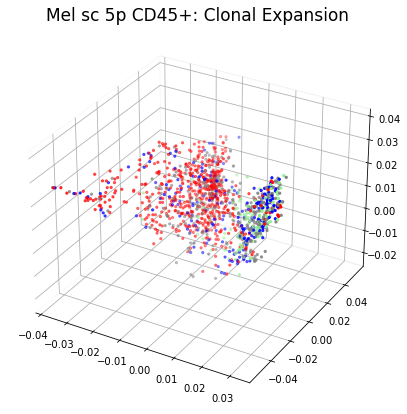

In [195]:
#plot clonalities of CD45+ cells in DC space
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')
randomize=np.arange(len(cd45))

colors = {"none":'grey',"single":"lightgreen","expanded":"blue","hyperexpanded":"red"}
ax.scatter(cd8.obs["Diffusion component 1"][cd45][randomize],cd8.obs["Diffusion component 3"][cd45][randomize],cd8.obs["Diffusion component 2"][cd45][randomize], c=pd.Series(np.asarray(clonality_colors)[cd45]).map(colors)[randomize],s=5)
plt.title("Mel sc 5p CD45+: Clonal Expansion",fontsize=17)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
plt.savefig("figures/tcells/cd45_clonality.pdf",format='pdf',bbox_inches='tight')

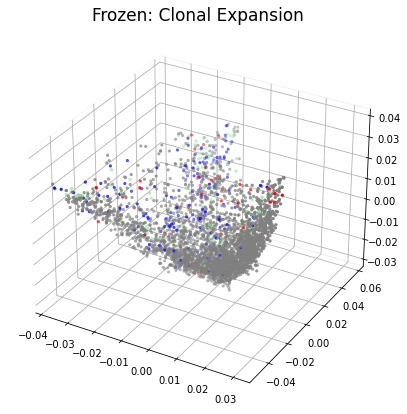

In [197]:
#plot clonal expansion in non CD45+ (frozen) cells in DC space
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection='3d')
randomize=np.arange(len(not_cd45))

colors = {"none":'grey',"single":"lightgreen","expanded":"blue","hyperexpanded":"red"}
ax.scatter(cd8.obs["Diffusion component 1"][not_cd45][randomize],cd8.obs["Diffusion component 3"][not_cd45][randomize],cd8.obs["Diffusion component 2"][not_cd45][randomize], c=pd.Series(np.asarray(clonality_colors)[not_cd45]).map(colors)[randomize],s=5)
plt.title("CD8 T-cells (frozen): Expanded Clones")
plt.title("Frozen: Clonal Expansion",fontsize=17)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
plt.savefig("figures/tcells/frozen_clonality.pdf",format='pdf',bbox_inches='tight')

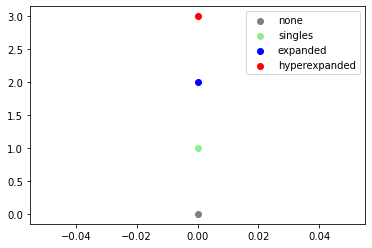

In [198]:
#generate legend
plt.scatter([0],[0],label='none',c='grey')
plt.scatter([0],[1],label='singles',c='lightgreen')
plt.scatter([0],[2],label='expanded',c='blue')
plt.scatter([0],[3],label='hyperexpanded',c='red')
plt.legend()
plt.savefig("figures/tcells/tcr_legend.pdf",format='pdf',bbox_inches='tight')

In [85]:
#CD45 clonality counts
np.unique(np.asarray(clonality_colors)[cd45],return_counts=True)

(array(['expanded', 'none', 'single'], dtype='<U8'), array([779, 319, 133]))

In [87]:
#bi005-snseq clonality counts
bi_sn = [i for i in range(len(clonality)) if 'bi005-skcm-5snseq' in cd8.obs["sample"][i]]
np.unique(np.asarray(clonality_colors)[bi_sn],return_counts=True)

(array(['expanded', 'none', 'single'], dtype='<U8'), array([ 18, 172,  15]))

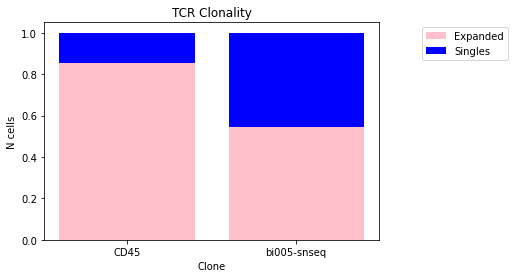

In [103]:
#make barplots to show distribution of clonalities in CD45+ vs bi005-snseq
c0 = np.asarray([779, 133])
c1 = np.asarray([18, 15])

c0 = c0/sum(c0)
c1 = c1/sum(c1)

y1 = [c0[0],c1[0]]
y2 = [c0[1],c1[1]]

x = ["CD45", "bi005-snseq"]
# plot bars in stack manner
plt.bar(x, y1, color='pink')
plt.bar(x, y2, bottom=y1, color='blue')
plt.xlabel("Clone")
plt.ylabel("N cells")
plt.legend(["Expanded","Singles"], loc='upper right',bbox_to_anchor=(1.4, 1))
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title("TCR Clonality")
plt.show()


In [174]:
#for generating the same as above but for the frozen samples
frozen = cd8[not_cd45,:]
frozen_clonality = np.asarray(clonality)[not_cd45]
frozen_clonality_colors = np.asarray(clonality_colors)[not_cd45]

In [176]:
#subsample by origin
mel = [i for i in range(len(frozen_clonality)) if 'bi005' in frozen.obs["sample"][i]]
uv = [i for i in range(len(frozen_clonality)) if 'uveal' in frozen.obs["site"][i]]
rib = [i for i in range(len(frozen_clonality)) if 'ribas_pre' in frozen.obs["site"][i]]

In [181]:
#frozen, mel clonality counts
np.unique(np.asarray(frozen_clonality_colors)[mel],return_counts=True)

(array(['expanded', 'none', 'single'], dtype='<U8'), array([ 18, 678,  15]))

In [182]:
#frozen, uveal clonality counts
np.unique(np.asarray(frozen_clonality_colors)[uv],return_counts=True)

(array(['expanded', 'none', 'single'], dtype='<U8'), array([ 162, 2360,  118]))

In [183]:
#frozen, ribas clonality counts
np.unique(np.asarray(frozen_clonality_colors)[rib],return_counts=True)

(array(['expanded', 'none', 'single'], dtype='<U8'), array([32, 49, 10]))

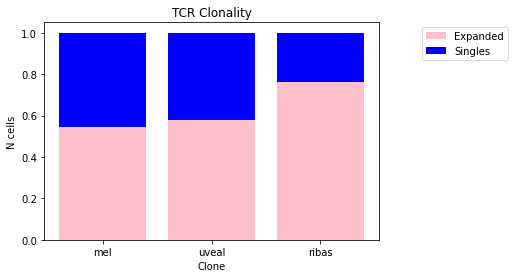

In [110]:
#make barplots to show distribution of clonalities in frozen samples
c0 = np.asarray([18, 15])
c1 = np.asarray([162, 118])
c2 = np.asarray([32, 10])

c0 = c0/sum(c0)
c1 = c1/sum(c1)
c2 = c2/sum(c2)

y1 = [c0[0],c1[0],c2[0]]
y2 = [c0[1],c1[1],c2[1]]

x = ["mel","uveal","ribas"]
# plot bars in stack manner
plt.bar(x, y1, color='pink')
plt.bar(x, y2, bottom=y1, color='blue')
plt.xlabel("Clone")
plt.ylabel("N cells")
plt.legend(["Expanded","Singles"], loc='upper right',bbox_to_anchor=(1.4, 1))
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title("TCR Clonality")
plt.show()

## Functions

In [74]:
def color_DCs(obs, ax, normed_df, normed):
    #plot some observation in the space of DCs
    ax.scatter(normed.obs["Diffusion component 1"],normed.obs["Diffusion component 3"],normed.obs["Diffusion component 2"], c=normed.obs[obs],s=5,cmap='viridis')
    ax.set_title(obs)

In [137]:
def diffusion_plot(key,ax,normed_df,normed):
    #plot interesting obs i.e. signatures in DC space
    tmp = []
    for i in sigs.loc[key]:
        if not pd.isnull(i):
            if "+" in i:
                gene = i.split("+")[0].strip()
                if gene in normed_df.columns:
                    tmp.append(normed_df[gene])
            elif "-" in i:
                gene = i.split("-")[0].strip()
                if gene in normed_df.columns:
                    tmp.append(normed_df[gene]*-1)
            else:
                if i in normed_df.columns:
                    tmp.append(normed_df[i])

    if len(tmp)!=0:
        signature = scipy.stats.zscore(np.mean(tmp,axis=0))


        p=ax.scatter(normed.obs["Diffusion component 1"],normed.obs["Diffusion component 3"],normed.obs["Diffusion component 2"], c=signature,s=5,vmax=1,cmap='viridis')
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
        ax.set_title(key,fontsize=17)

In [45]:
def umap_plot(key,ax,normed_df,normed):
    #plot interesting obs i.e. signatures in UMAP space
    tmp = []
    for i in sigs.loc[key]:
        if not pd.isnull(i):
            if "+" in i:
                gene = i.split("+")[0].strip()
                if gene in normed_df.columns:
                    tmp.append(normed_df[gene])
            elif "-" in i:
                gene = i.split("-")[0].strip()
                if gene in normed_df.columns:
                    tmp.append(normed_df[gene]*-1)
            else:
                if i in normed_df.columns:
                    tmp.append(normed_df[i])

    if len(tmp)!=0:
        signature = scipy.stats.zscore(np.mean(tmp,axis=0))


        ax.scatter(normed.obsm['X_umap'][:,0],normed.obsm['X_umap'][:,1], c=signature,s=5,vmax=1,cmap='viridis')
        ax.set_title(key)

In [13]:
def make_rnk(normed, ind,flip=False):
    #generate ranked gene (rnk) files for GSEA or other analyses
    corr=[]
    t7_df=normed.to_df()
    nump=np.asarray(t7_df)
    diffcomp=normed.obsm["X_diffmap"][:,ind]
    if flip: 
        diffcomp = -1*diffcomp
    for i in range(t7_df.shape[1]):
        pearson=scipy.stats.pearsonr(diffcomp,nump[:,i])
        corr.append(pearson[0])

    rnk=pd.DataFrame({"genes": t7_df.columns,"pearson": corr})
    rnk=rnk.sort_values(by="pearson",ascending=False)

    #remove NaNs, mito/ribo genes
    nans_index=[]
    for i in rnk.index:
        if np.isnan(rnk["pearson"][i]):
            nans_index.append(i)
        if "MT-" in rnk["genes"][i] or "RPS" in rnk["genes"][i] or "RPL" in rnk["genes"][i]:
            nans_index.append(i)
    rnk=rnk.drop(np.unique(nans_index))
    return rnk